In [1]:
# pip install cartopy
# pip install cdo
# pip install mycolorpy

In [2]:
import numpy as np
import pandas as pd
import xarray as xr
from matplotlib import cm
import cartopy.crs as ccrs
import matplotlib.pyplot as plt 
import os
import scipy
import matplotlib.colors
from matplotlib.colors import BoundaryNorm
import cdo
CDO = cdo.Cdo
import netCDF4
import datetime
from mycolorpy import colorlist as mcp


In [3]:
# climcal4.giub.unibe.ch:/scratch3/martinw/rnn/figure_data/
input_folder="/Users/mwegmann/Documents/small_spark/figure_data/"

## Figure 1

In [4]:
pseudo_proxy_location=pd.read_csv(input_folder+"EKF400_v1_assim_ISTI_less1831_smallest.txt", delimiter = " ")
lats=pseudo_proxy_location.Lat.values
lons=pseudo_proxy_location.Lon.values
pseudo_proxy_location.head()

,Station ID,Var,Lon,Lat,fyr,lyr
11,USC00508503,temp2,-135.333298,57.049999,1828,1990
69,USC00226177,temp2,-91.340797,31.588900,1799,2005
125,USW00013880,temp2,-80.040298,32.898602,1823,2005
184,USW00014735,temp2,-73.809196,42.743099,1795,2005
245,IN020040900,temp2,80.182999,13.000000,1796,2005


### Figure 1a

I select out of large local files the january 1901 field of the first member.

Once we chose the winter for the story telling in figure 5, we could use the same winter here in Figure 1. I think that would be a nice continuity.

In [5]:
#CDO.seltimestep(1,input="-selyear,1901 "+pathToMPIGE + 'tas_Amon_all_datapoints_anoms.nc',output=pathToMPIGE + 'mem01_january1901_anom.nc')
#CDO.seltimestep(1,input="-selyear,1901 "+'/Volumes/SPARK/20crv3/t2m/20CRv3_allyears_allmembers_t2m_anoms.nc',output=pathToERA + 'mem01_january1901_anom.nc')
#CDO.seltimestep(1,input="-selyear,1901 "+pathToCSMLME + 'TREFHT_Amon_all_datapoints_anoms.nc',output=pathToCSMLME + 'mem01_january1901_anom.nc')


In [6]:
ds1 = xr.open_dataset(input_folder+"mem01_january1901_anom_20cr_mem.nc")
ds1_var=ds1["2t"].drop('height')
ds1_var = ds1_var.squeeze('height')
ds2 = xr.open_dataset(input_folder+"mem01_january1901_anom_csmlme.nc")
ds2_var=ds2.TREFHT
ds3 = xr.open_dataset(input_folder+"mem01_january1901_anom_mpige.nc")
ds3_var=ds3.tas

''

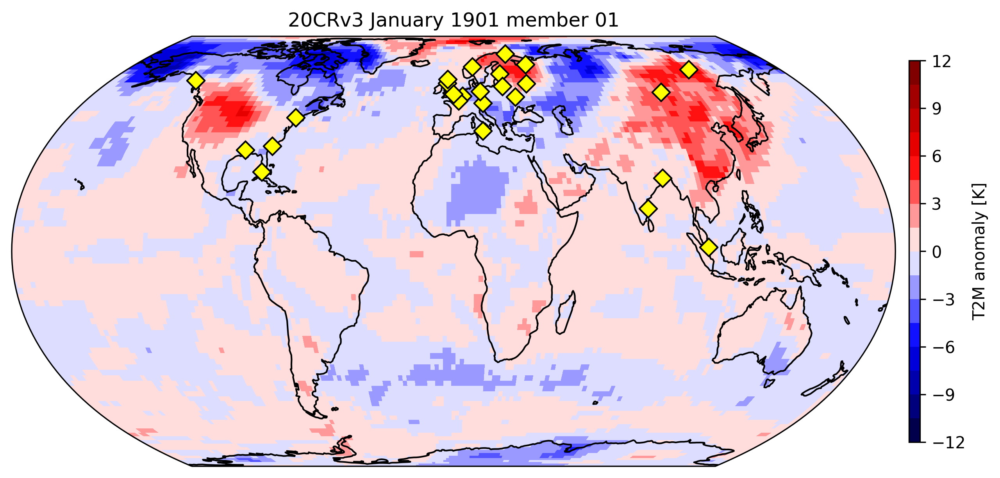

In [7]:
fig = plt.figure(figsize=(10, 5), dpi= 300)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds1_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=12, cmap=cm.seismic, cbar_kwargs={'orientation':'vertical',
'fraction':0.012, 'pad':0.015, 'aspect':35})
ax.scatter(lons[0:25],lats[0:25],transform=ccrs.PlateCarree(),s=60,marker="D",facecolor='yellow',edgecolor="k",zorder=2)

#ax.scatter(lons[25:29],lats[25:29],transform=ccrs.PlateCarree(),s=50,marker='*',facecolor='yellow')



tplot.colorbar.set_label('T2M anomaly [K]', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('20CRv3 January 1901 member 01')
;

''

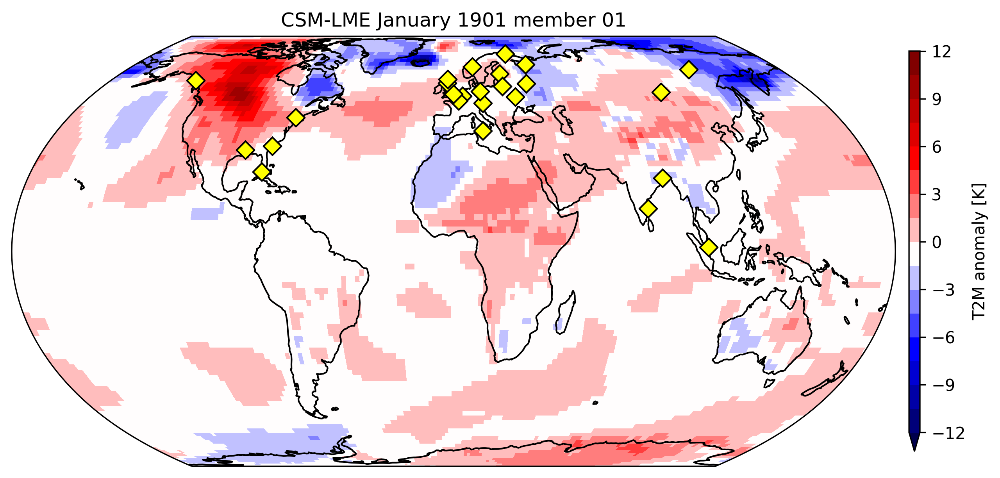

In [8]:
fig = plt.figure(figsize=(10, 5), dpi= 300)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds2_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=12, cmap=cm.seismic, cbar_kwargs={'orientation':'vertical',
'fraction':0.012, 'pad':0.015, 'aspect':35})
ax.scatter(lons[0:25],lats[0:25],transform=ccrs.PlateCarree(),s=60,marker="D",facecolor='yellow',edgecolor="k",zorder=2)

#ax.scatter(lons[25:29],lats[25:29],transform=ccrs.PlateCarree(),s=50,marker='*',facecolor='yellow')



tplot.colorbar.set_label('T2M anomaly [K]', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('CSM-LME January 1901 member 01')
;

''

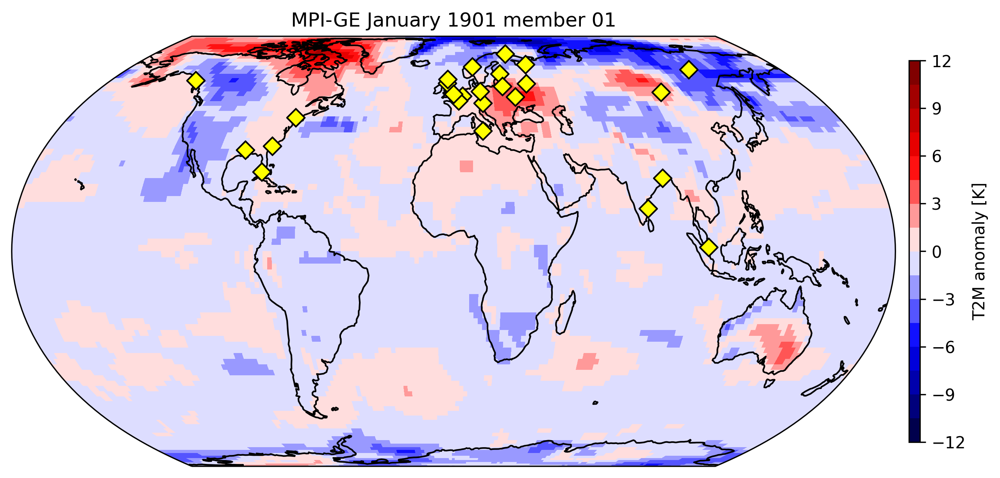

In [9]:
fig = plt.figure(figsize=(10, 5), dpi= 300)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds3_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=12, cmap=cm.seismic, cbar_kwargs={'orientation':'vertical',
'fraction':0.012, 'pad':0.015, 'aspect':35})
ax.scatter(lons[0:25],lats[0:25],transform=ccrs.PlateCarree(),s=60,marker="D",facecolor='yellow',edgecolor="k",zorder=2)

#ax.scatter(lons[25:29],lats[25:29],transform=ccrs.PlateCarree(),s=50,marker='*',facecolor='yellow')



tplot.colorbar.set_label('T2M anomaly [K]', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('MPI-GE January 1901 member 01')
;

### Figure 1b

In [10]:
arr = os.listdir(input_folder)
input_paths=[]
for file in os.listdir(input_folder):
    if file.startswith("EKF400v2_"):
        input_folder_file=os.path.join(input_folder, file)
        input_paths.append(input_folder_file)
len(input_paths)

30

In [11]:
emptyobject=[]

member_index_length = len(input_paths)

for i in range(member_index_length):
    df2 = pd.read_csv(input_paths[i], delimiter = ";",header=None)
    df = pd.DataFrame(df2.values, index=pd.period_range('1602-01-16', '2003-12-16',freq="m"))
    # frames = [df.assign(sample=i) for i, df in enumerate(frames)]
    #frames = [df.assign(sample=i) for i, df in enumerate(frames)]

    emptyobject.append(df)
    #plt.figure(figsize=(10, 5), dpi= 300)
    #df.plot(xlabel='Time', ylabel='[K]', title='anomalies wrt 1951-1980',grid=1,style='.',colormap=cm.viridis, ax = plt.gca(), alpha=0.4)



df3 = pd.concat(emptyobject,axis=1)



In [12]:
df3.shape # 4824 months, 25 stations times 30 member

(4824, 750)

In [13]:
select_one_station=np.arange(0,750,25)
select_one_station

array([  0,  25,  50,  75, 100, 125, 150, 175, 200, 225, 250, 275, 300,
       325, 350, 375, 400, 425, 450, 475, 500, 525, 550, 575, 600, 625,
       650, 675, 700, 725])

In [14]:
a=np.random.randint(1000, size=(200))
a=np.array(a)
a=lats
color1=mcp.gen_color_normalized(cmap="viridis",data_arr=a)
# plt.scatter(a,a,c=color1)

In [15]:
df3_select_one_station=pd.DataFrame(df3.values[3588:3588+12,select_one_station])
df3_select_all_station=pd.DataFrame(df3.values[3588:3588+12,:])
df3_one_station=pd.DataFrame(df3.values[:,select_one_station])
df3_all_station_one_member=pd.DataFrame(df3.values[:,0:25])
df3_all_station_one_member_one_year=pd.DataFrame(df3.values[3588:3588+12,0:25])
df3_all_station_one_member_100_year=pd.DataFrame(df3.values[3624:4824,0:25])

In [16]:
df3_select_one_station.shape

(12, 30)

Text(0.5, 1.0, 'Member Spread 1901 Station #1')

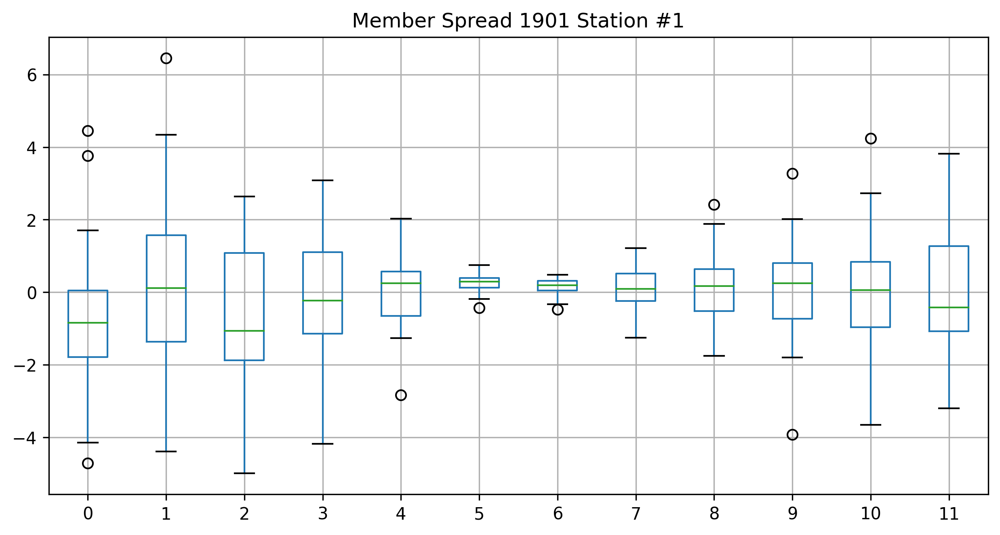

In [17]:
plt.figure(figsize=(10, 5), dpi= 300)
df3_select_one_station.T.boxplot()
plt.title("Member Spread 1901 Station #1")

<AxesSubplot:title={'center':'EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980'}, xlabel='Time', ylabel='[K]'>

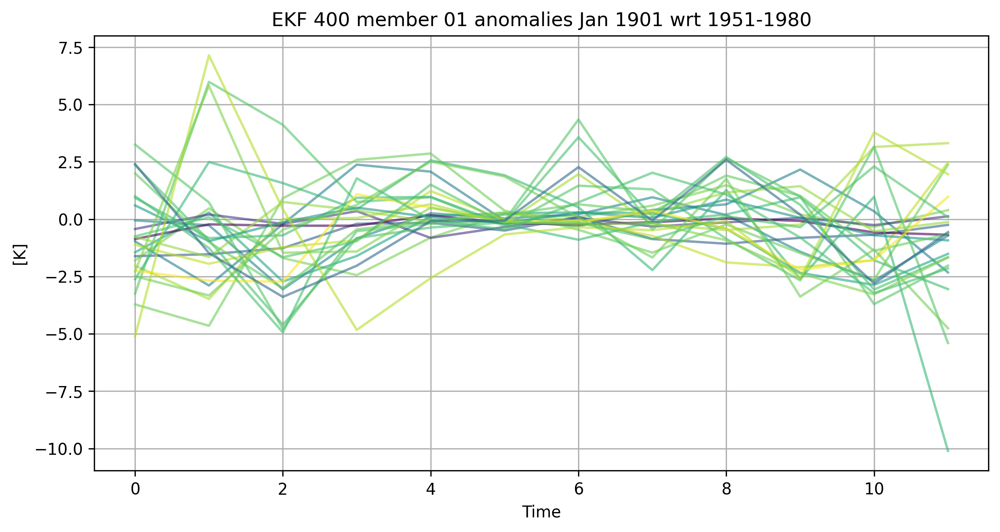

In [18]:
# 25 pseudo stations, one member. I prefer this figure as figure 1 b
plt.figure(figsize=(10, 5), dpi= 300)
df3_all_station_one_member_one_year.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies Jan 1901 wrt 1951-1980',grid=1,style='-',color=color1, ax = plt.gca(), alpha=0.6,legend=False)

<AxesSubplot:title={'center':'EKF 400 member 01-30 anomalies Jan 1901 wrt 1951-1980'}, xlabel='Time', ylabel='[K]'>

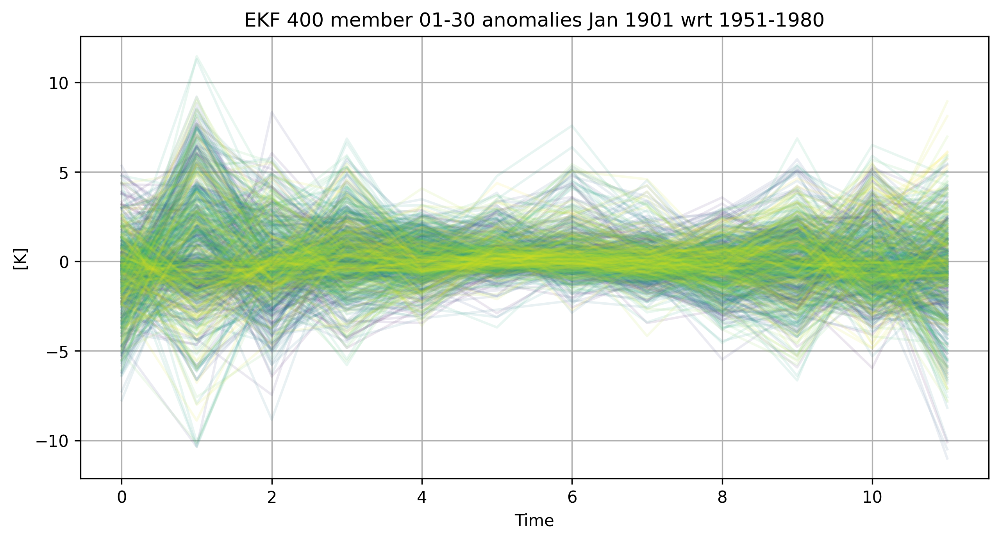

In [19]:
# 25 pseudo stations, all member
plt.figure(figsize=(10, 5), dpi= 300)
df3_select_all_station.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01-30 anomalies Jan 1901 wrt 1951-1980',grid=1,style='-',colormap=cm.viridis, ax = plt.gca(), alpha=0.1,legend=False)






<AxesSubplot:title={'center':'EKF 400 member 01 anomalies anomalies wrt 1951-1980'}, xlabel='Time', ylabel='[K]'>

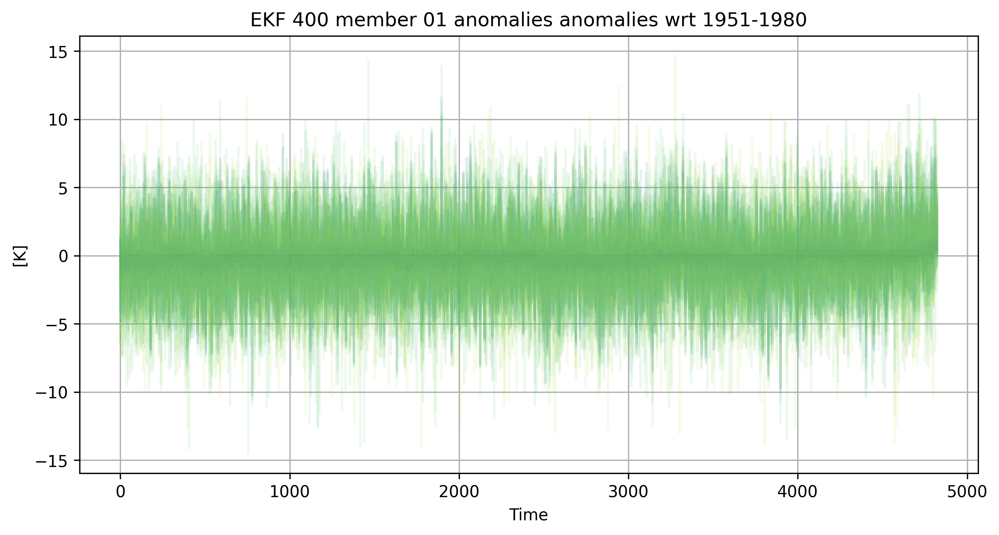

In [20]:
# 25 pseudo stations, one member
plt.figure(figsize=(10, 5), dpi= 300)
df3_all_station_one_member.plot(xlabel='Time', ylabel='[K]', title='EKF 400 member 01 anomalies anomalies wrt 1951-1980',grid=1,color=color1,style='-', ax = plt.gca(), alpha=0.1,legend=False)





## Figure 2

In [21]:
current_cmap = cm.get_cmap("seismic")
current_cmap.set_bad(color='gray')

/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("seismic"))
  


In [22]:

ds2 = xr.open_dataset(input_folder + 'best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_monthly_masked.nc')
ds2_var=ds2.t2m
ds2a = xr.open_dataset(input_folder + 'best_model_ekf400_anoms_mpige_lowres_25_20000_RNN1lstm_memcorr_matrix_rnn_ekf400_monthly_masked.nc')
ds2a_var=ds2a.t2m
ds3 = xr.open_dataset(input_folder + 'best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_YM_masked.nc')
ds3_var=ds3.t2m

ds3a = xr.open_dataset(input_folder + 'best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_lmr_YM_masked.nc')
ds3a_var=ds3a.t2m

ds6 = xr.open_dataset(input_folder + 'best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_JJA_masked.nc')
ds6_var=ds6.t2m
ds7 = xr.open_dataset(input_folder + 'best_model_ekf400_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_DJF_masked.nc')
ds7_var=ds7.t2m





### Figure 2a

/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:310: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


''

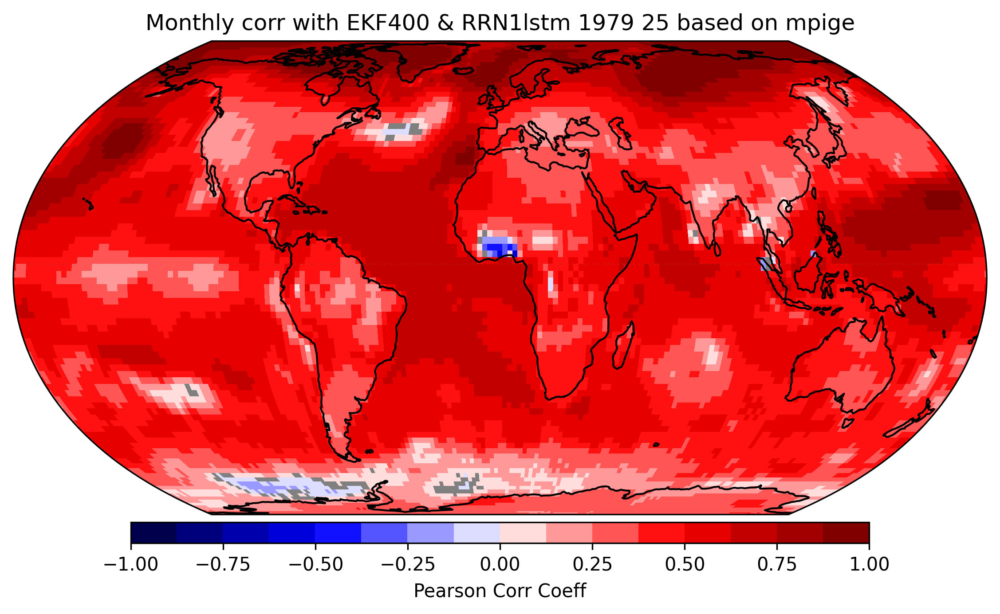

In [23]:
fig = plt.figure(figsize=(10, 5), dpi= 300)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds2_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=1, cmap=cm.seismic, cbar_kwargs={'orientation':'horizontal',
'fraction':0.042, 'pad':0.015, 'aspect':35})

tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('Monthly corr with EKF400 & RRN1lstm 1979 25 based on mpige')
;

''

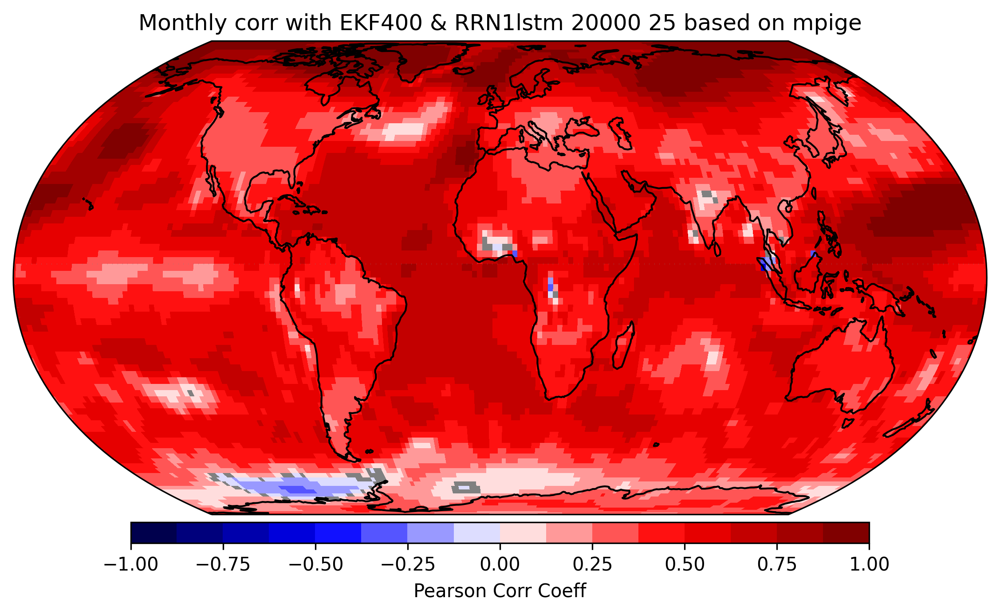

In [24]:
fig = plt.figure(figsize=(10, 5), dpi= 300)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds2a_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=1, cmap=cm.seismic, cbar_kwargs={'orientation':'horizontal',
'fraction':0.042, 'pad':0.015, 'aspect':35})

tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('Monthly corr with EKF400 & RRN1lstm 20000 25 based on mpige')
;

### Figure 2b

''

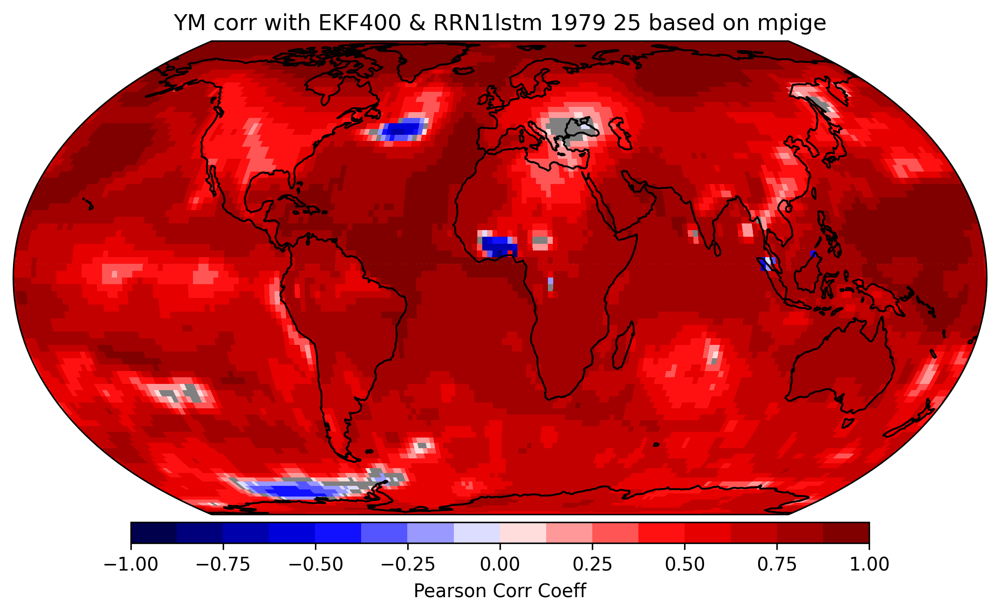

In [25]:
fig = plt.figure(figsize=(10, 5), dpi= 300)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds3_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=1, cmap=cm.seismic, cbar_kwargs={'orientation':'horizontal',
'fraction':0.042, 'pad':0.015, 'aspect':35})

tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('YM corr with EKF400 & RRN1lstm 1979 25 based on mpige')
;

''

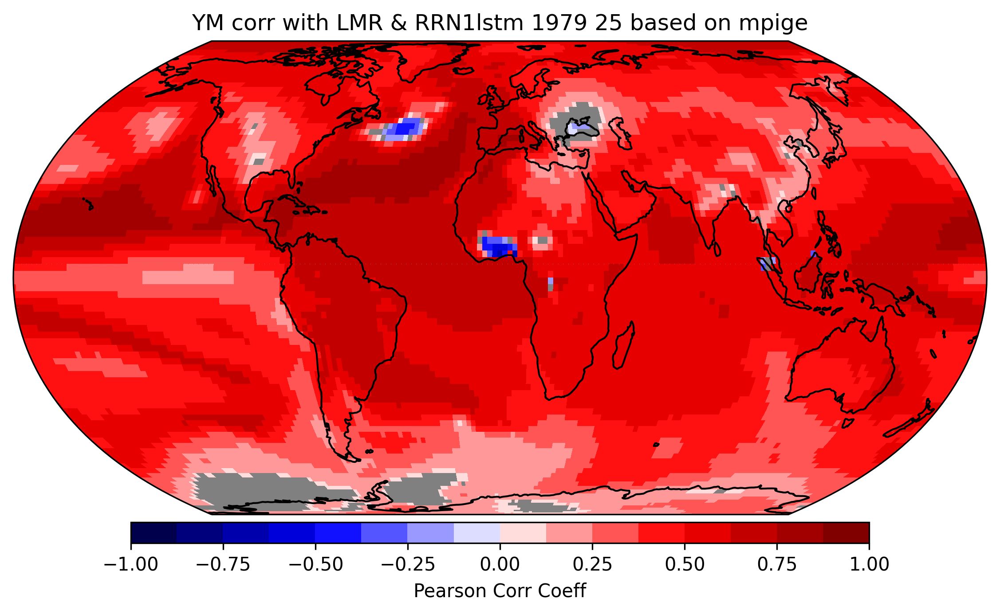

In [26]:
fig = plt.figure(figsize=(10, 5), dpi= 300)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds3a_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=1, cmap=cm.seismic, cbar_kwargs={'orientation':'horizontal',
'fraction':0.042, 'pad':0.015, 'aspect':35})

tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('YM corr with LMR & RRN1lstm 1979 25 based on mpige')
;

### Figure 2c

''

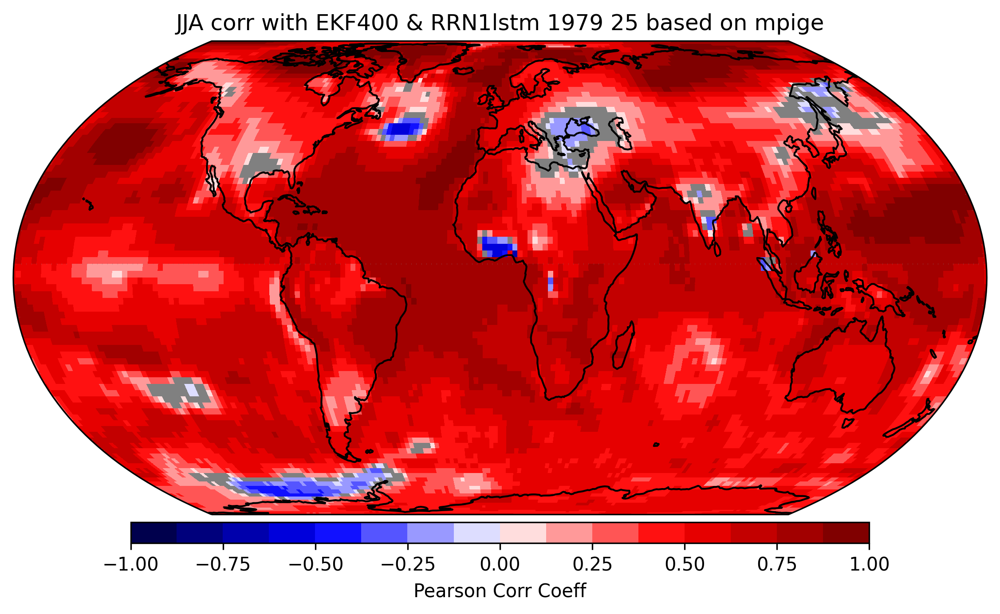

In [27]:
fig = plt.figure(figsize=(10, 5), dpi= 300)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds6_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=1, cmap=cm.seismic, cbar_kwargs={'orientation':'horizontal',
'fraction':0.042, 'pad':0.015, 'aspect':35})

tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('JJA corr with EKF400 & RRN1lstm 1979 25 based on mpige')
;

### Figure 2d

''

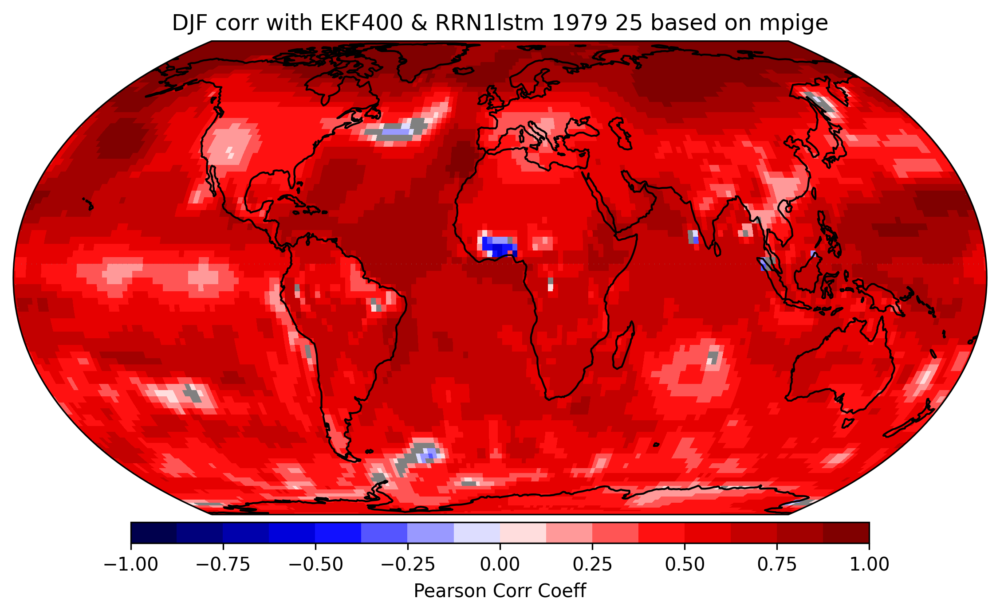

In [28]:
fig = plt.figure(figsize=(10, 5), dpi= 300)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds7_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=1, cmap=cm.seismic, cbar_kwargs={'orientation':'horizontal',
'fraction':0.042, 'pad':0.015, 'aspect':35})

tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('DJF corr with EKF400 & RRN1lstm 1979 25 based on mpige')
;

### Alternative figure 2 with ensemble mean from 30 members

In [29]:

ds2 = xr.open_dataset(input_folder + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_monthly_masked.nc')
ds2_var=ds2.t2m
ds3 = xr.open_dataset(input_folder + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_YM_masked.nc')
ds3_var=ds3.t2m

ds3a = xr.open_dataset(input_folder + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_lmr_YM_masked.nc')
ds3a_var=ds3a.t2m

ds6 = xr.open_dataset(input_folder + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_JJA_masked.nc')
ds6_var=ds6.t2m
ds7 = xr.open_dataset(input_folder + 'best_model_ekf400m_anoms_mpige_lowres_25_1979_RNN1lstm_memcorr_matrix_rnn_ekf400_DJF_masked.nc')
ds7_var=ds7.t2m





/Users/mwegmann/miniconda2/envs/temprec/lib/python3.7/site-packages/cartopy/mpl/geoaxes.py:310: UserWarning: The colormap's 'bad' has been set, but in order to wrap pcolormesh across the map it must be fully transparent.
  return func(self, *args, **kwargs)


''

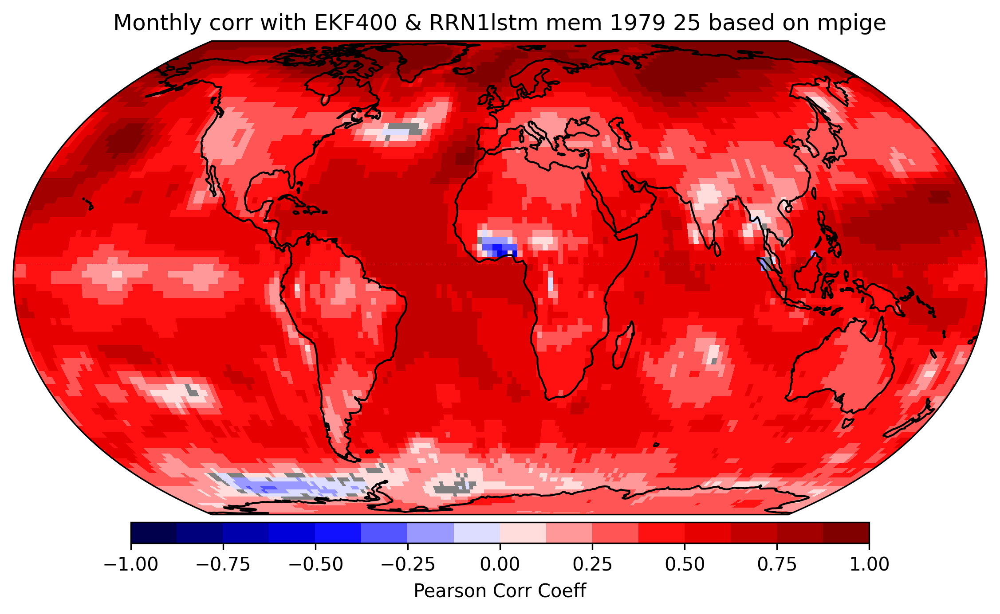

In [30]:
fig = plt.figure(figsize=(10, 5), dpi= 300)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds2_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=1, cmap=cm.seismic, cbar_kwargs={'orientation':'horizontal',
'fraction':0.042, 'pad':0.015, 'aspect':35})

tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('Monthly corr with EKF400 & RRN1lstm mem 1979 25 based on mpige')
;

''

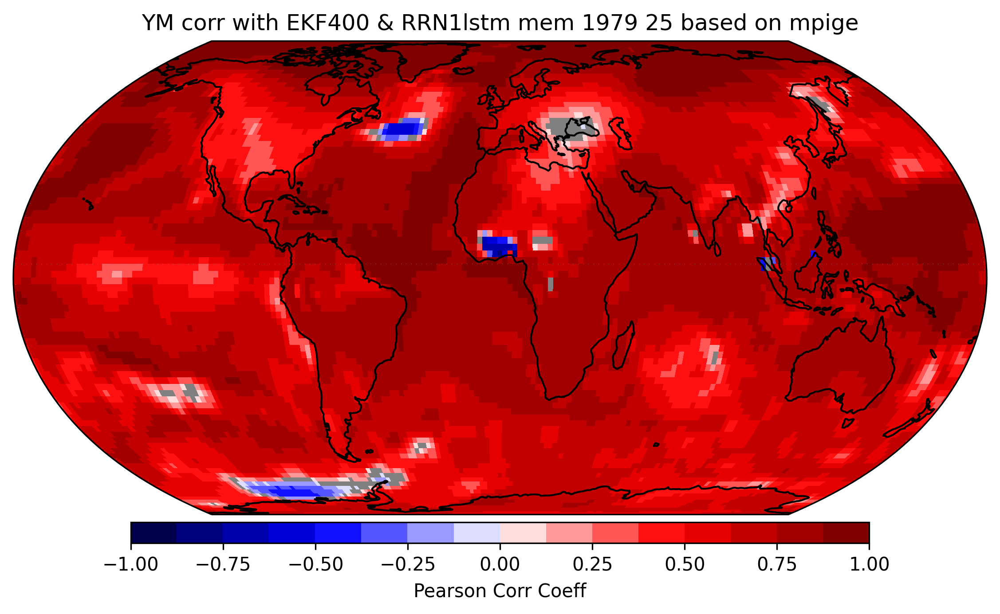

In [31]:
fig = plt.figure(figsize=(10, 5), dpi= 300)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds3_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=1, cmap=cm.seismic, cbar_kwargs={'orientation':'horizontal',
'fraction':0.042, 'pad':0.015, 'aspect':35})

tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('YM corr with EKF400 & RRN1lstm mem 1979 25 based on mpige')
;

''

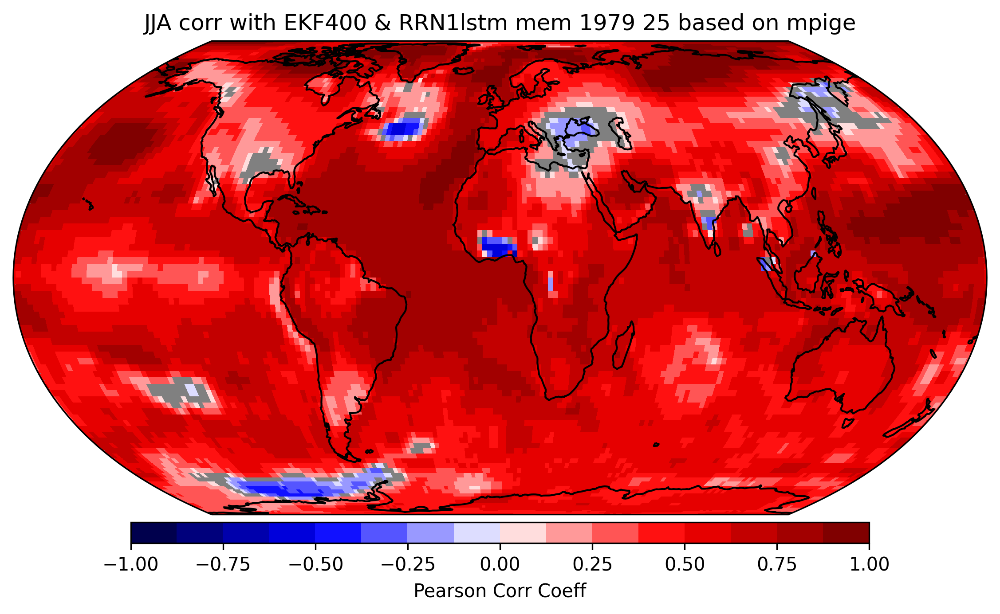

In [32]:
fig = plt.figure(figsize=(10, 5), dpi= 300)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds6_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=1, cmap=cm.seismic, cbar_kwargs={'orientation':'horizontal',
'fraction':0.042, 'pad':0.015, 'aspect':35})

tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('JJA corr with EKF400 & RRN1lstm mem 1979 25 based on mpige')
;

''

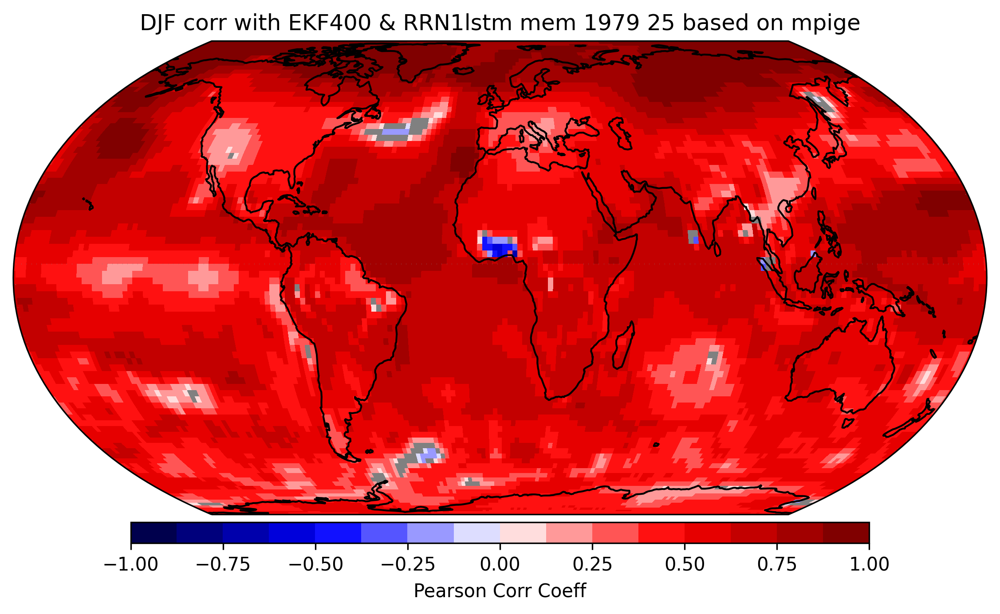

In [33]:
fig = plt.figure(figsize=(10, 5), dpi= 300)
ax = plt.axes(projection=ccrs.EqualEarth(central_longitude=0, globe=None)) 
tplot=ds7_var.isel(time=0).plot.pcolormesh(ax=ax,
levels = 17, transform=ccrs.PlateCarree(), vmax=1, cmap=cm.seismic, cbar_kwargs={'orientation':'horizontal',
'fraction':0.042, 'pad':0.015, 'aspect':35})

tplot.colorbar.set_label('Pearson Corr Coeff', size=10) 
tplot.ylabel_style = {'size':16}

ax.set_global()
ax.coastlines()
ax.set_title('DJF corr with EKF400 & RRN1lstm mem 1979 25 based on mpige')
;

## Figure 3